# Interpretable Font Generation With Texture Synthesis Notebook
### **Author**: Xu Dong
### **Github link**: (https://github.com/dx199771/font_generation)
### **Google Drive link**: (https://drive.google.com/drive/folders/1kmd-IQOUktefLss5WiF7ZASKrJxlzSNv?usp=sharing)

## Introduction:
Welcome! In this notebook, we will give a thorough explanation of the implementation on how to use the font generation model.
This tutorial contains four following steps:


1.   Run font generation on existing glyph models.
2.   Run texture synthesis on existing texture models.
3.   Apply synthesised texture on generated glyph.
4.   Display and save the generated font images.

In the **first step**, the model is able to automatically generate various glyph with 8 different font themes (Old school, comic, fancy, western, curly, medieval, pixel and sans_serif), you can choose your favorite theme. You are able to adjust font properties such as thickness and rotation by changing `code_input` variable.

In the **second step**, you can choose a synthesised texture to be applied on a glyph iamge.

In the **third and fourth steps**, you are able to apply synthesised texture on generated glyph and to show and save the generated font images.

You can also train your own glyph models and synthesis your own texture by using your training data in **OPTIONAL** cell.

## **Have fun!**

## <h1><img width=30 src="https://upload.wikimedia.org/wikipedia/commons/thumb/6/6d/Bright_green_checkbox-checked.svg/1024px-Bright_green_checkbox-checked.svg.png">  **Step 1. Glyph Generation**

In [1]:
#@title Imports your reporsitory and some important libraries, you can either use GitHub or GoogleDrive. Here we recommend to use GitHub.
# You can either load files from GitHub or upload from local files

# Clone from github
!git clone https://github.com/dx199771/font_generation

# Download from google drive
#!gdown --id 1cUaIEd9-MLJHFGjLz5QziNvfBtYygplX

from google.colab import files

import torch
import argparse
import numpy as np
from ipywidgets import interact, widgets
import matplotlib.pyplot as plt
from PIL import Image

# import some pytorch libraries
#from nets.info_GAN import Discriminator, Generator
from torch.autograd import Variable
from torchvision.utils import save_image
from font_generation.nets.info_GAN import Discriminator, Generator
# if GPU available
cuda = True if torch.cuda.is_available() else False
FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


Cloning into 'font_generation'...
remote: Enumerating objects: 625, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 625 (delta 4), reused 12 (delta 3), pack-reused 601
Receiving objects: 100% (625/625), 402.79 MiB | 28.90 MiB/s, done.
Resolving deltas: 100% (64/64), done.


## Data
Several pre-trained models for glyph generation are provided, you can play around with different models:

*   old_school
*   comic
*   fancy
*   western
*   curly
*   medieval
*   pixel
*   sans_serif


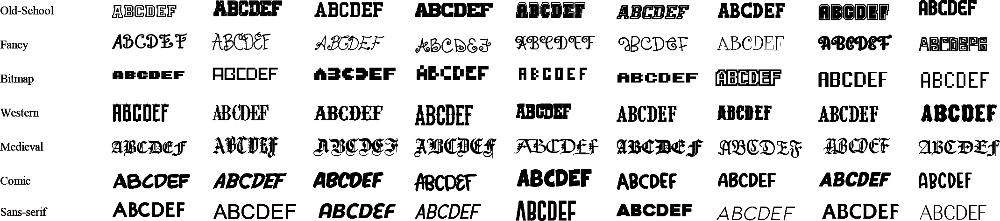

In [21]:
#@title Choose your favourite font theme.
# choose your font theme model
model_choice = "pixel"  # @param ["sans_serif", "comic", "old_school",  "fancy", "western(not available)", "curly(not available)", "medieval(not available)", "pixel"]

switcher = {
    "old_school": "./font_generation/models/generator_OldSchool.pt",
    "comic": "./font_generation/models/generator_comic.pt",
    "fancy": "./font_generation/models/generator_fancy.pt",
    "western(not available)":"./font_generation/models/generator_western.pt",
    "curly(not available)":"./font_generation/models/generator_curly.pt",
    "medieval(not available)":"./font_generation/models/generator_medieval.pt",
    "pixel":"./font_generation/models/generator_bitmap.pt",
    "sans_serif":"./font_generation/models/generator_SansSerif.pt",
}
dataset = switcher[model_choice]

# Define some useful variables
# Number of channels for generator
channels = 1

# Size of generated image
img_size = 64

# Size of z latent vector
latent_dim = 62

# Size of lebel vector
label_dim = 26

# Size of code vector
code_dim = 2

# Output directory
opt_dir = ""




## Run the model, display and save the generated glyph image!

In [22]:
#@title Try different latent code and input character.

# Input latent vector
z = Variable(FloatTensor(np.random.normal(0, 1,(1, latent_dim))))

# Input label vector
input_char = 'P' # @param ["A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L", "M", "N", "O", "P", "Q", "E", "S", "T", "U", "V", "W", "X", "Y", "Z"]
if model_choice == "sans_serif":
  one_hot_lookup = {
      "A":1,"B":2,"C":3,"D":4,"E":6,"F":5,"G":15,"H":8,"I":9,"J":10,"K":11,"L":12,"M":13,"N":14,"O":7,"P":16,"Q":17,"R":18,"S":19,"T":20,"U":21,"V":22,"W":23,"X":24,"Y":25,"Z":0
  }
if model_choice == "comic":
  one_hot_lookup = {
      "A":1,"B":2,"C":3,"D":4,"E":5,"F":6,"G":7,"H":8,"I":9,"J":10,"K":11,"L":12,"M":13,"N":14,"O":15,"P":16,"Q":17,"R":18,"S":19,"T":20,"U":21,"V":22,"W":23,"X":24,"Y":25,"Z":0
  }
if model_choice == "old_school":
  one_hot_lookup = {
      "A":1,"B":18,"C":4,"D":16,"E":3,"F":6,"G":7,"H":8,"I":9,"J":11,"K":21,"L":12,"M":23,"N":13,"O":17,"P":5,"Q":15,"R":2,"S":19,"T":0,"U":10,"V":22,"W":23,"X":24,"Y":25,"Z":20
  }
if model_choice == "pixel":
  one_hot_lookup = {
      "A":3,"B":2,"C":5,"D":4,"E":0,"F":6,"G":7,"H":8,"I":12,"J":10,"K":13,"L":11,"M":9,"N":14,"O":16,"P":18,"Q":17,"R":15,"S":19,"T":20,"U":22,"V":23,"W":21,"X":24,"Y":25,"Z":1
  }
if model_choice == "fancy":
  one_hot_lookup = {
      "A":1,"B":2,"C":4,"D":16,"E":5,"F":6,"G":3,"H":8,"I":9,"J":11,"K":11,"L":12,"M":13,"N":14,"O":4,"P":16,"Q":17,"R":18,"S":19,"T":20,"U":21,"V":22,"W":23,"X":24,"Y":25,"Z":0
  }
# create one hot encoder
one_hot = np.zeros((1,26))
one_hot[0,one_hot_lookup[input_char]]=1
label_input = Variable(FloatTensor(one_hot))


# Code input for infoGAN (parameter of output image, shape, thickness, rotation etc.)
first_code_input = -0.1 #@param {type:"slider", min:-2, max:2, step:0.1}
second_code_input = -0.1 #@param {type:"slider", min:-2, max:2, step:0.1}
code_input = Variable(FloatTensor([[first_code_input, second_code_input]]))

noise_input = torch.cat((label_input, z),-1)

# Load model
model = Generator(channels,img_size,latent_dim+label_dim,code_dim)
model.load_state_dict(torch.load(dataset))
model.to(device)
with torch.no_grad():
  sample1 = model(noise_input, code_input).detach().cpu()
  #save and show the image
  save_image(sample1.data, './img{}.png'.format(1) , normalize=True)
  gly_img = plt.imread("img1.png")
  plt.imshow(gly_img, cmap="gray")
  plt.show()

FileNotFoundError: ignored

## <h1><img width=30 src="https://upload.wikimedia.org/wikipedia/commons/thumb/6/6d/Bright_green_checkbox-checked.svg/1024px-Bright_green_checkbox-checked.svg.png">  **Step 2.Texture Synthesis**
Several pre-synthesised texture for texture synthesis are provided, you can play around with different texture image, or train your own one:
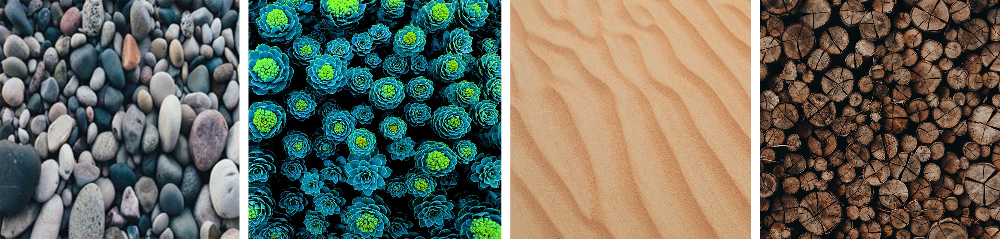

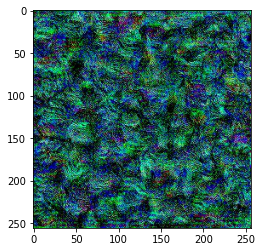

In [11]:
#@title Choose your favourite texture.
# choose your texture image.
model_choice = "flower"  # @param ["stone", "wood", "desert", "flower", ""]

switcher = {
    "stone": "./font_generation/data/texture_data/stone_final_av2.jpg",
    "wood": "./font_generation/data/texture_data/wood3_final_av2.jpg",
    "desert": "./font_generation/data/texture_data/deset_final_av3.jpg",
    "flower": "./font_generation/data/texture_data/texture_final_v2.jpg",
    "": "./font_generation/data/texture_data/",
}
dataset = switcher[model_choice]


tex_img = plt.imread(dataset)
plt.imshow(tex_img, cmap="gray")
plt.show()

## <h1><img width=30 src="https://upload.wikimedia.org/wikipedia/commons/thumb/6/6d/Bright_green_checkbox-checked.svg/1024px-Bright_green_checkbox-checked.svg.png">  **Step 3. Apply Synthesised Texture On Generated Font**

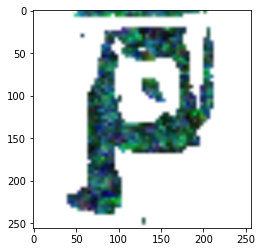

In [12]:
import cv2
def mixture(src, texture_, size):
    """
    Apply synthesised texture on generated glyph images
    :param src: sorce glyph image
    :param texture_: source texture image
    :return:
    """

    s_h, s_w, s_c = src.shape
    texture = cv2.resize(texture_,(s_h,s_w),cv2.INTER_AREA)
    imgray = cv2.cvtColor(src,cv2.COLOR_BGR2GRAY).astype('uint8')

    #thresh = cv2.adaptiveThreshold(imgray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)

    for i in range(s_h):
        for j in range(s_w):
            if (imgray[j,i] == 0):
                texture[j,i,0] = 255
                texture[j,i,1] = 255
                texture[j,i,2] = 255

    texture = cv2.resize(texture,(size,size),cv2.INTER_AREA)

    cv2.imwrite("../output.png",texture)
    plt.imshow(texture)
    plt.show()


    #cv2.imshow("contours",texture)
    #cv2.waitKey(0)
    #cv2.destroyWindow()

mixture(gly_img,tex_img,256)

## <h1><img width=30 src="https://upload.wikimedia.org/wikipedia/commons/thumb/6/6d/Bright_green_checkbox-checked.svg/1024px-Bright_green_checkbox-checked.svg.png">  **OPTIONAL**:
## Train your own glyph model here!
Load your font dataset and run the training process 


In [13]:
# download glyph network training data
!gdown --id 17o5CcGtC_cbDOuz4xaAKY-IolZtq2swt
!unzip -q GAN_training_data.zip -d font_generation/data 

import sys
sys.path.append("/content/font_generation")

import os
import numpy as np
import torch, os, argparse, itertools

import torch.utils.data as data
from torchvision import datasets
import torch.autograd as autograd
from torch.autograd import Variable
from torchvision.utils import save_image
import torchvision.transforms as transforms
from nets.info_GAN import Discriminator, Generator


Downloading...
From: https://drive.google.com/uc?id=17o5CcGtC_cbDOuz4xaAKY-IolZtq2swt
To: /content/GAN_training_data.zip
332MB [00:03, 102MB/s]


## Train your own glyph model here!

You can change parameters in the below cell.



In [14]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epochs", type=int, default=3000, help="number of epochs of training")
parser.add_argument("--batch_size", type=int, default=155, help="size of the batches")
parser.add_argument("--lr", type=float, default=0.0005, help="azdam: learning rate")
parser.add_argument("--b1", type=float, default=0.5, help="adam: decay of first order momentum of gradient")
parser.add_argument("--b2", type=float, default=0.999, help="adam: decay of first order momentum of gradient")
parser.add_argument("--n_cpu", type=int, default=8, help="number of cpu threads to use during batch generation")
parser.add_argument("--latent_dim", type=int, default=62, help="dimensionality of the latent space")
parser.add_argument("--code_dim", type=int, default=2, help="latent code dimension")
parser.add_argument("--label_dim", type=int, default=26, help="training labels dimension")
parser.add_argument("--n_classes", type=int, default=26, help="number of classes for dataset")
parser.add_argument("--img_size", type=int, default=64, help="size of each image dimension")
parser.add_argument("--channels", type=int, default=1, help="number of image channels")
parser.add_argument("--sample_interval", type=int, default=500, help="interval between image sampling")
parser.add_argument("--buffer_size", type=int, default=1536, help="size of training data of each letter")
parser.add_argument("--lambda_con", type=float, default=0.1, help="lambda constant for info loss")
parser.add_argument("--lambda_gp", type=float, default=10, help="lambda constant for for gradient penalty")
parser.add_argument("--training_dir", type=str, default="/content/font_generation/data/GAN_training_data/dafont/Sans serif", help="style font training directory")
parser.add_argument("--training_label_dir", type=str, default="/content/font_generation/data/trainin_labels.txt", help="style font training label directory")
parser.add_argument("--output_static_dir", type=str, default="/content/font_generation/results/GAN_opt/static/", help="GANs static output directory")
parser.add_argument("--output_v1_dir", type=str, default="/content/font_generation/results/GAN_opt/varying_c1", help="GANs variation 1 output directory")
parser.add_argument("--output_v2_dir", type=str, default="/content/font_generation/results/GAN_opt/varying_c2", help="GANs variation 2 output directory")
parser.add_argument("--trained_dir", type=str, default="/content/font_generation/models/generator_Sans serif2000.pt", help="GANs generator model directory")

opt, unknown = parser.parse_known_args()


def dataset(training_dir=opt.training_dir):
    """Get training data from data folder"""
    data_transform = transforms.Compose([
                        transforms.Resize(opt.img_size),
                        transforms.CenterCrop(opt.img_size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                        transforms.Grayscale(num_output_channels=1),
                    ])
    training_data_lists = [name for name in os.listdir(training_dir)]

    img = datasets.ImageFolder(training_dir, transform=data_transform)
    img_loader = torch.utils.data.DataLoader(img, batch_size=opt.batch_size, shuffle=False)
    return img_loader

def weights_init_normal(m):
    """Weight initialization function for G and D"""
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

def compute_gradient_penalty(D, real_samples, fake_samples):
    """Calculates the gradient penalty loss for WGAN GP"""
    # Random weight term for interpolation between real and fake samples
    alpha = Tensor(np.random.random((real_samples.size(0), 1, 1, 1)))
    # Get random interpolation between real and fake samples
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True)

    d_interpolates = D(interpolates)
    fake = Variable(Tensor(real_samples.shape[0], 1).fill_(1.0), requires_grad=False)
    # Get gradient w.r.t. interpolates
    gradients = autograd.grad(
        outputs=d_interpolates[0],
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]

    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty

def one_hot_generation(target,num_classes,batch_size=1):
    """ One-hot encoding generator for Conditional GAN"""
    one_hot = np.zeros((batch_size,num_classes))
    for i in range(batch_size):
        one_hot[i,target] = 1
    return one_hot

def sample_image(n_row, batches_done):
    """Saves a grid of generated digits ranging from 0 to n_classes"""
    # if folder doen't exist
    os.makedirs(opt.output_static_dir, exist_ok=True)
    os.makedirs(opt.output_v1_dir, exist_ok=True)
    os.makedirs(opt.output_v2_dir, exist_ok=True)

    os.makedirs(opt.output_static_dir+'/'+str(batches_done), exist_ok=True)

    z = Variable(FloatTensor(np.random.normal(0, 1, (1, opt.latent_dim))))

    for i in range(26):

        one_hot = np.zeros((1, 26))
        one_hot[0, i] = 1
        label_input = Variable(FloatTensor(one_hot))


        code_input = Variable(FloatTensor([[0.5, -0.5]]))
        device = torch.device("cuda")
        generator.to(device)

        noise_input = torch.cat((label_input, z), -1)
        with torch.no_grad():
            output_ = generator(noise_input, code_input).detach().cpu()
            save_image(output_, opt.output_static_dir+str(batches_done)+"/img{}.png".format(i))


In [15]:
# training step
def train_step(dataloader):

    print(
        "--START TRAINING-- \n--TOTAL: %d EPOCHS, BATCH SIZE: %d, LEARNING RATE: %f.--"
        % (opt.n_epochs, opt.batch_size, opt.lr)
    )

    for epoch in range(opt.n_epochs):
        for i, (imgs, labels) in enumerate(dataloader):
            batch_size = imgs.shape[0]
            # Adversarial ground truths
            valid = Variable(FloatTensor(batch_size, 1).fill_(1.0), requires_grad=False)
            fake = Variable(FloatTensor(batch_size, 1).fill_(0.0), requires_grad=False)

            # Configure input
            real_imgs = Variable(imgs.type(FloatTensor))

            # -----------------
            #  Train Generator
            # -----------------

            optimizer_G.zero_grad()

            # Sample noise and labels as generator input
            z = Variable(FloatTensor(np.random.normal(0, 1, (batch_size, opt.latent_dim))))
            label_input = Variable(FloatTensor(one_hot_generation(labels[0],opt.n_classes,batch_size)))
            code_input = Variable(FloatTensor(np.random.uniform(-2, 2, (batch_size, opt.code_dim))))
            noise_input = torch.cat((label_input, z), -1)
            # Generate a batch of images
            gen_imgs = generator(noise_input, code_input)

            # Loss measures generator's ability to fool the discriminator
            validity, _ = discriminator(gen_imgs)
            g_loss = -torch.mean(validity)
            g_loss.backward()
            optimizer_G.step()

            # ---------------------
            #  Train Discriminator
            # ---------------------

            optimizer_D.zero_grad()

            # Loss for real images
            real_pred, _ = discriminator(real_imgs)
            d_real_loss = adversarial_loss(real_pred, valid)

            # Loss for fake images
            fake_pred, _ = discriminator(gen_imgs.detach())

            # WGAN-GP gradient penalty function
            gradient_penalty = compute_gradient_penalty(discriminator, real_imgs.data, gen_imgs.data)
            # Wasserstein GAN loss function
            d_loss = -torch.mean(real_pred) + torch.mean(fake_pred) + opt.lambda_gp * gradient_penalty

            # Total discriminator loss
            d_loss.backward()
            optimizer_D.step()

            # ------------------
            # Information Loss
            # ------------------

            optimizer_info.zero_grad()

            # Sample noise, labels and code as generator input
            z = Variable(FloatTensor(np.random.normal(0, 1, (batch_size, opt.latent_dim))))
            code_input = Variable(FloatTensor(np.random.uniform(-2, 2, (batch_size, opt.code_dim))))
            noise_input = torch.cat((label_input, z), -1)

            gen_imgs = generator(noise_input, code_input)
            _, pred_code = discriminator(gen_imgs)
            info_loss = opt.lambda_con * continuous_loss(
                pred_code, code_input
            )

            info_loss.backward()
            optimizer_info.step()

            # --------------
            # Log Progress
            # --------------
            print(
                "[Epoch: %d/%d] [Batch: %d/%d] [D loss: %f] [G loss: %f] [Info loss: %f]"
                % ( epoch, opt.n_epochs, i, len(dataloader), d_loss.item(), g_loss.item(), info_loss.item())
            )
            batches_done = epoch * len(dataloader) + i
            if batches_done % opt.sample_interval == 0:
                sample_image(n_row=opt.n_classes, batches_done=batches_done)
                torch.save(generator.state_dict(), opt.trained_dir)

    return 0

In [16]:

"""GANs training process"""
# Generator and discriminator initialization
generator = Generator(opt.channels,opt.img_size,opt.latent_dim+opt.label_dim,opt.code_dim)
discriminator = Discriminator(opt.channels,opt.img_size,opt.latent_dim+opt.label_dim,opt.code_dim)

# Initialize weights
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

# Loss functions
adversarial_loss = torch.nn.MSELoss()
categorical_loss = torch.nn.CrossEntropyLoss()
continuous_loss = torch.nn.MSELoss()

# Optimizer
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_info = torch.optim.Adam(
    itertools.chain(generator.parameters(), discriminator.parameters()), lr=opt.lr, betas=(opt.b1, opt.b2)
)

# Cuda configuration
cuda = True if torch.cuda.is_available() else False
FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if cuda else torch.LongTensor
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()
    categorical_loss.cuda()
    continuous_loss.cuda()

# Static generator inputs for sampling
static_z = Variable(FloatTensor(np.zeros((opt.n_classes * 10, opt.latent_dim))))
label_input = Variable(FloatTensor(np.random.randint(0, 26, (opt.n_classes * 10, opt.label_dim))))
static_noise_input = torch.cat((static_z, label_input), -1)
static_code = Variable(FloatTensor(np.zeros((opt.n_classes * 10, opt.code_dim))))

# Start training
train_step(dataset(opt.training_dir))

# Save generator model
torch.save(generator.state_dict(), opt.trained_dir)

--START TRAINING-- 
--TOTAL: 3000 EPOCHS, BATCH SIZE: 155, LEARNING RATE: 0.000500.--
[Epoch: 0/3000] [Batch: 0/102] [D loss: 9.988301] [G loss: 0.011003] [Info loss: 0.121868]
[Epoch: 0/3000] [Batch: 1/102] [D loss: 9.985209] [G loss: 0.010853] [Info loss: 0.132406]
[Epoch: 0/3000] [Batch: 2/102] [D loss: 9.980236] [G loss: 0.010359] [Info loss: 0.125405]
[Epoch: 0/3000] [Batch: 3/102] [D loss: 9.975061] [G loss: 0.010108] [Info loss: 0.149863]
[Epoch: 0/3000] [Batch: 4/102] [D loss: 9.966068] [G loss: 0.009935] [Info loss: 0.125164]
[Epoch: 0/3000] [Batch: 5/102] [D loss: 9.954133] [G loss: 0.008830] [Info loss: 0.130783]
[Epoch: 0/3000] [Batch: 6/102] [D loss: 9.938137] [G loss: 0.006988] [Info loss: 0.127149]
[Epoch: 0/3000] [Batch: 7/102] [D loss: 9.915988] [G loss: 0.002448] [Info loss: 0.137826]
[Epoch: 0/3000] [Batch: 8/102] [D loss: 9.880686] [G loss: -0.000306] [Info loss: 0.123753]
[Epoch: 0/3000] [Batch: 9/102] [D loss: 9.830270] [G loss: -0.011943] [Info loss: 0.122015]
[E

KeyboardInterrupt: ignored

## Train your own synthesised texture here!

You can change parameters in the below cell.


Load your source texture image and run the training process 


In [17]:
# download vgg16 model for texture synthesis
!gdown --id 13OMiX9YTxBovm28hASit1wVzJQaUgQjo
!unzip -q vgg16.zip -d font_generation/nets
import numpy as np
import torch

import argparse
import utils.texture_synthesis_tools as tools
import nets.vgg16_texture as net
from PIL import Image

parser = argparse.ArgumentParser()
parser.add_argument("--input_width", type=int, default=256, help="width of input image")
parser.add_argument("--input_height", type=int, default=256, help="height of input image")
parser.add_argument("--input_file", type=str, default="/content/font_generation/data/texture_data/earth.jpg", help="input ground truth image url")
parser.add_argument("--output_file", type=str, default="/Texture_processed.jpg", help="output ground truth processed image name")
parser.add_argument("--output_path", type=str, default="/content/font_generation/data/texture_data", help="output synthesised image url")
parser.add_argument("--epochs", type=int, default=15000, help="numbers epochs of training")
parser.add_argument("--lr", type=float, default="0.001", help="adam: learning rate")
parser.add_argument("--output_dir", type=str, default="/content/font_generation/results/Texture_opt/", help="Output directory of texture synthesis")
parser.add_argument("--before_opt_filename", type=str, default="Texture_0_before.jpg", help="Output file name before texture synthesis")
parser.add_argument("--after_opt_filename", type=str, default="Texture_0_after.jpg", help="Output file name after texture synthesis")
opt, unknown = parser.parse_known_args()


Downloading...
From: https://drive.google.com/uc?id=13OMiX9YTxBovm28hASit1wVzJQaUgQjo
To: /content/vgg16.zip
513MB [00:06, 81.9MB/s]


In [18]:

# Training process of texture synthesis

def loss_func(m, texture_opt, noise_opt):
    # This function takes initial ground truth texture image and noise data
    # Output the loss for a given layer by using Gram matrix
    loss_ = 0
    for i in range(len(m)):
        texture_filters = torch.squeeze(texture_opt[m[i][0]], 0)
        texture_filters_ = torch.reshape(texture_filters, shape=(
        texture_filters.shape[1] * texture_filters.shape[2], texture_filters.shape[0]))

        #Gram Matrix computation
        gram_matrix_texture = torch.matmul(texture_filters_.T, texture_filters_)
        noise_filters = torch.squeeze(noise_opt[m[i][0]], 0)
        noise_filters_= torch.reshape(noise_filters,
                                   shape=(noise_filters.shape[1] * noise_filters.shape[2], noise_filters.shape[0]))
        gram_matrix_noise = torch.matmul(torch.transpose(noise_filters_,1,0), noise_filters_)
        denominator = (4 * torch.tensor(texture_filters_.shape[1]) * torch.tensor(
            texture_filters_.shape[0]))

        # Calculate loss function of all layers
        loss = m[i][1] * (torch.sum(torch.square(torch.subtract(gram_matrix_texture, gram_matrix_noise))) / denominator.float())
        loss_ = loss_ + loss
    return loss_


def texture_train(input_filename, processed_path, processed_filename, m, eps, op_dir, initial_filename, final_filename):

    # Load vgg16 net
    vgg16 = net.Vgg16()
    if cuda:
        vgg16 = vgg16.cuda()

    # Read and pre-process training image
    texture_data = tools.resize_img(input_filename, opt.input_width, opt.input_height, processed_path,processed_filename, device)

    texture_outputs = tools.compute_layer_output(texture_data, vgg16)

    # data normalizaiton parameters
    # Generate random initial noise data

    random = np.random.rand(texture_data.shape[0],texture_data.shape[1],texture_data.shape[2],texture_data.shape[3])
    # normalization
    random[:, 0, :, :] = random[:, 0, :, :] - mean[0]
    random[:, 1, :, :] = random[:, 1, :, :] - mean[1]
    random[:, 2, :, :] = random[:, 2, :, :] - mean[2]
    random = Tensor(random)
    # Feed to vgg16
    vgg16.forward(random)

    # Optimizer
    optimizer = torch.optim.Adam([random.requires_grad_()], lr=opt.lr)

    for i in range(eps):
        vgg16.forward(random)
        noise_layers_list = dict(
            {0: vgg16.conv1_1, 1: vgg16.conv1_2, 2: vgg16.pool1, 3: vgg16.conv2_1, 4: vgg16.conv2_2, 5: vgg16.pool2,
             6: vgg16.conv3_1,
             7: vgg16.conv3_2,
             8: vgg16.conv3_3, 9: vgg16.pool3, 10: vgg16.conv4_1, 11: vgg16.conv4_2, 12: vgg16.conv4_3, 13: vgg16.pool4,
             14: vgg16.conv5_1, 15: vgg16.conv5_2,
             16: vgg16.conv5_3, 17: vgg16.pool5})
        loss = loss_func(m, texture_outputs, noise_layers_list)
        optimizer.zero_grad()
        loss.backward(retain_graph=True)
        optimizer.step()
        print("Epoch:{}/{} Loss:{}.".format(i,eps,loss))

        if(i%499 == 0):
            final_noise = random
            final_filename_ = final_filename+str(i)+".jpg"
            final_noise_ = tools.post_process_and_display(final_noise, op_dir, final_filename_,input_file = 0)
            tools.match_his_output(processed_path+processed_filename, final_noise_,opt.output_path)
    #initial_noise = tools.post_process_and_display(random, op_dir, initial_filename,save_file=True)
    return final_noise_


In [ ]:
#@title Training Process
# if gpu available
cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# VGG RGB normalization colour value
mean = [0.5, 0.5, 0.5]
# processing layers
m = [(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)]

# Start training
texture_train(opt.input_file,opt.output_path,opt.output_file,m, opt.epochs,opt.output_dir,
              opt.before_opt_filename,opt.after_opt_filename)



npy file loaded
tensor(-0.5000, device='cuda:0') tensor(0.4961, device='cuda:0') xx
build model...
build model finished: 0s
All layers' outputs have been computed successfully.
build model...
build model finished: 0s
build model...
build model finished: 0s
Epoch:0/15000 Loss:14896822.0.
build model...
build model finished: 0s
Epoch:1/15000 Loss:13913009.0.
build model...
build model finished: 0s
Epoch:2/15000 Loss:13046453.0.
build model...
build model finished: 0s
Epoch:3/15000 Loss:12290635.0.
build model...
build model finished: 0s
Epoch:4/15000 Loss:11637354.0.
build model...
build model finished: 0s
Epoch:5/15000 Loss:11077165.0.
build model...
build model finished: 0s
Epoch:6/15000 Loss:10599778.0.
build model...
build model finished: 0s
Epoch:7/15000 Loss:10194587.0.
build model...
build model finished: 0s
Epoch:8/15000 Loss:9850659.0.
build model...
build model finished: 0s
Epoch:9/15000 Loss:9557466.0.
build model...
build model finished: 0s
Epoch:10/15000 Loss:9305483.0.
buil

KeyboardInterrupt: ignored